# Experiments with the diversity condition violated

In this notebook I will perform the SimCLR experiments where the diversity condition was violated. Mathematically it essentially means that we will use the following distributions for sampling:

- $p(z) = \frac{1}{|\mathcal{Z}|}$ - Marginal distribution is simply a uniform distribution on a sphere
- $p(\tilde{z}|z) = \delta(u-u') \frac{e^{\kappa \tilde{z}^{T}z}}{\int_{W}e^{\kappa v^{T}v' dv}}$

Where the latent space can be decomposed into 2 components $z = (u,v)^{T}$ where $u \in R^{n}$, $v \in R^{m}$, and $m + n = d$ - the dimension of the latent space.

I will primarily work with hyper-spheres as my latent space, hence the condition $z^{2} = u^{2} + v^{2} = 1$ will be enforced.

Experiment with these data-generating processes:

- Identity ✅
- Linear Mapping (to 4D, 5D, 6D, 7D) ✅
- Spirals ✅
- Patches ✅
- Injective Neural Network as a data generating process ✅

For now fix one dimension (the first one):

Consider later:

- Fix multiple dimensions
- Fix dimensions randomly


Additionally, we want to take an orthogonal transformation and check that the loss in our sampling experiment is higher than the loss we have achieved by directly optimizing the neural network $f$

In [9]:
%load_ext autoreload
%autoreload 2

import sys
import os
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), '..'))

import torch
from torch import nn
from torch import functional
from simclr.simclr import SimCLR
from encoders import get_mlp
import matplotlib.pyplot as plt
from spaces import NSphereSpace
from visualization_utils.spheres import visualize_spheres_side_by_side

from experiment_utils.simclr_executor import SimCLRExecutor


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 6144
tau = 0.3
kappa = 1 / tau
iterations = 10000
latent_dim = 3

fixed_dims_on_sample = 1

full_sphere = NSphereSpace(3)
sub_sphere = NSphereSpace(2)


def sample_conditional_with_dims_fixed(z, batch, u_dim):
    u = z[:,:u_dim]
    v = z[:,u_dim:]

    v_norm = torch.nn.functional.normalize(v, dim=-1, p=2)
    aug_samples_v = sub_sphere.von_mises_fisher(v_norm, kappa, batch) * torch.norm(v, p=2, dim=-1, keepdim=True)

    return torch.cat((u, aug_samples_v), dim=-1)


def sample_pair_with_fixed_dimension(batch, u_dim):
    z = full_sphere.uniform(batch) # (N, 3)
    
    return z, sample_conditional_with_dims_fixed(z, batch, u_dim)

sample_uniform_fixed = lambda batch: full_sphere.uniform(batch)
sample_pair_fixed = lambda batch: sample_pair_with_fixed_dimension(batch, fixed_dims_on_sample)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Visualizing the constrained sampling procedure

Below you can see how samples from the constrained sampling distribution look like

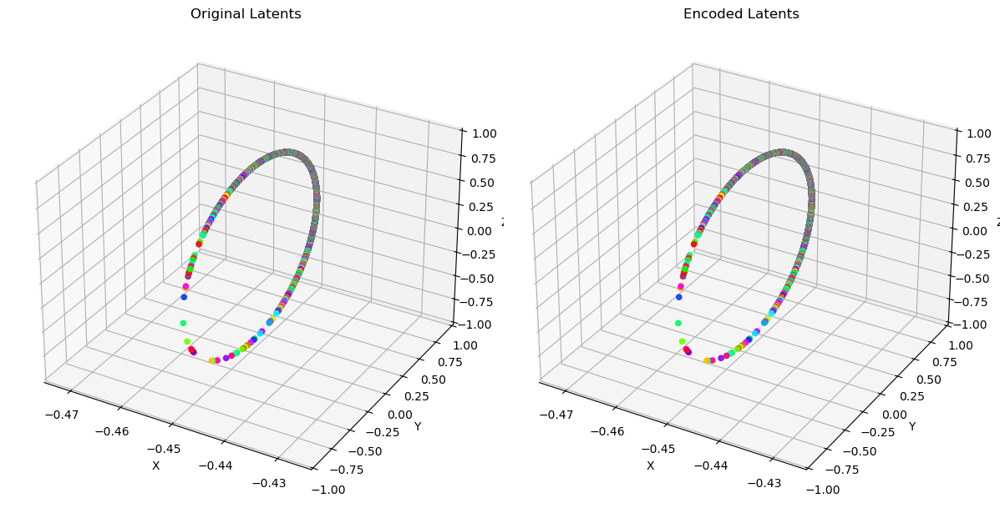

In [2]:
z = sample_uniform_fixed(1).squeeze(0)

u = z[:1]
v = z[1:]

v_norm = torch.nn.functional.normalize(v, dim=-1, p=2)
aug_samples_v = sub_sphere.von_mises_fisher(v_norm, kappa, batch_size) * torch.norm(v, p=2, dim=-1, keepdim=True)

z_aug = torch.cat((u.expand(batch_size, 1), aug_samples_v), dim=-1)

visualize_spheres_side_by_side(plt, z_aug, z_aug)

## Training the identity generating process

$g(z) = z$

Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.857005596160889 Samples processed: 1 linear disentanglement: 0.8529518246650696 permutation disentanglement: 0.062145669013261795 angle_preservation_error: 0.2579088807106018
Loss: 7.865070343017578 Samples processed: 21 linear disentanglement: 0.8546074032783508 permutation disentanglement: 0.062042754143476486 angle_preservation_error: 0.2555178701877594


Loss: 7.82230281829834 Samples processed: 41 linear disentanglement: 0.8526630401611328 permutation disentanglement: 0.06388584524393082 angle_preservation_error: 0.252495139837265
Loss: 7.826896667480469 Samples processed: 61 linear disentanglement: 0.8489293456077576 permutation disentanglement: 0.06181975081562996 angle_preservation_error: 0.2502962350845337
Loss: 7.821244716644287 Samples processed: 81 linear disentanglement: 0.8507323861122131 permutation disentanglement: 0.06730858236551285 angle_preservation_error: 0.24843543767929077
Loss: 7.818760871887207 Samples processed: 101 linear disentanglement: 0.8501920104026794 permutation disentanglement: 0.0714285746216774 angle_preservation_error: 0.24520714581012726
Loss: 7.772353172302246 Samples processed: 121 linear disentanglement: 0.8506852984428406 permutation disentanglement: 0.07415886968374252 angle_preservation_error: 0.2434709072113037
Loss: 7.76039981842041 Samples processed: 141 linear disentanglement: 0.853380918502

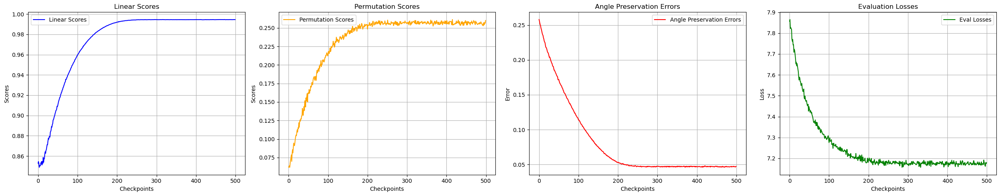

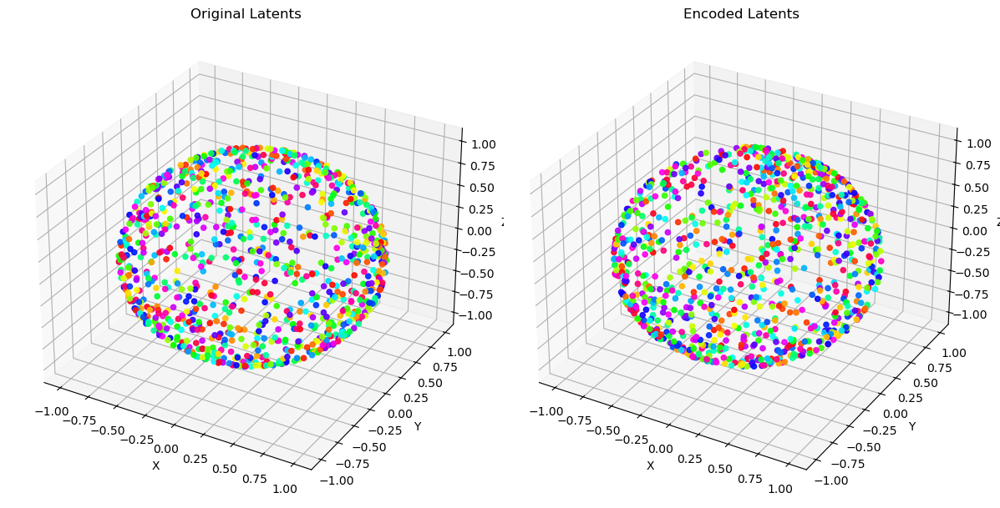

Orthogonal transformation loss:  7.19373893737793
Training loss:  7.179072380065918


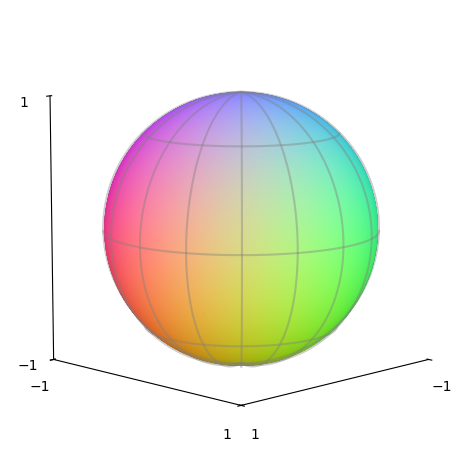

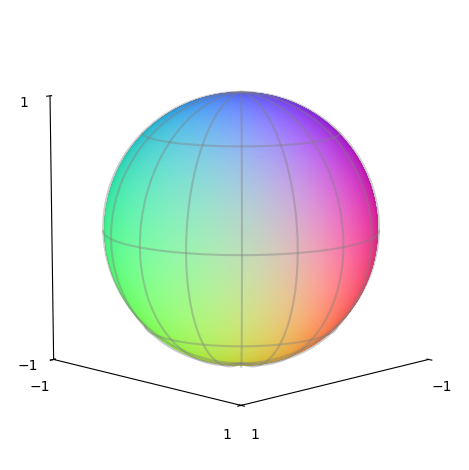

In [4]:
from visualization_utils.scoring import plot_scores
from visualization_utils.spheres import scatter3d_sphere
from encoders import LinearEncoder

g_id = nn.Identity()

f, scores = SimCLRExecutor(
    LinearEncoder(3, 3), g_id, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Linear map generating process

$g(z) = Az$, where $A \in \mathbb{R}^{k \times 3}$ and $k \in \{4,5,6,7\}$ and $rank(A) = 3$

Linear control score: 1.0
Permutation control score: 0.9999999999999999
Loss: 8.125433921813965 Samples processed: 1 linear disentanglement: 0.6457754969596863 permutation disentanglement: 0.10318654775619507 angle_preservation_error: 0.35926681756973267
Loss: 8.118734359741211 Samples processed: 21 linear disentanglement: 0.642732560634613 permutation disentanglement: 0.09781084209680557 angle_preservation_error: 0.35703980922698975
Loss: 8.105464935302734 Samples processed: 41 linear disentanglement: 0.6502879858016968 permutation disentanglement: 0.11255326122045517 angle_preservation_error: 0.35288652777671814
Loss: 8.09669017791748 Samples processed: 61 linear disentanglement: 0.6507300138473511 permutation disentanglement: 0.11027447134256363 angle_preservation_error: 0.35055842995643616
Loss: 8.095239639282227 Samples processed: 81 linear disentanglement: 0.6411605477333069 permutation disentanglement: 0.10811591148376465 angle_preservation_error: 0.34890541434288025
Loss: 8.076

Loss: 7.823444366455078 Samples processed: 661 linear disentanglement: 0.6319096684455872 permutation disentanglement: 0.17572961747646332 angle_preservation_error: 0.2650945484638214
Loss: 7.818978786468506 Samples processed: 681 linear disentanglement: 0.6293687224388123 permutation disentanglement: 0.1806880682706833 angle_preservation_error: 0.26525622606277466
Loss: 7.80902624130249 Samples processed: 701 linear disentanglement: 0.6333112716674805 permutation disentanglement: 0.17988885939121246 angle_preservation_error: 0.2633218467235565
Loss: 7.810153961181641 Samples processed: 721 linear disentanglement: 0.631511390209198 permutation disentanglement: 0.17636112868785858 angle_preservation_error: 0.2642943263053894
Loss: 7.798961639404297 Samples processed: 741 linear disentanglement: 0.6294265389442444 permutation disentanglement: 0.18639208376407623 angle_preservation_error: 0.26129356026649475
Loss: 7.79285192489624 Samples processed: 761 linear disentanglement: 0.629036426

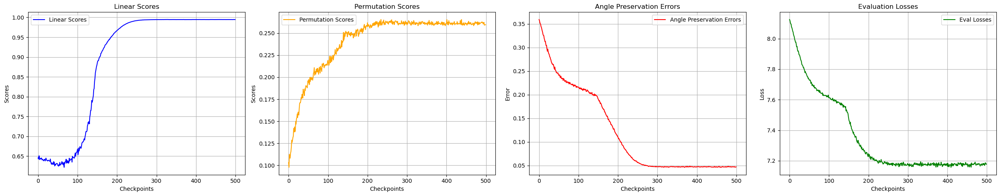

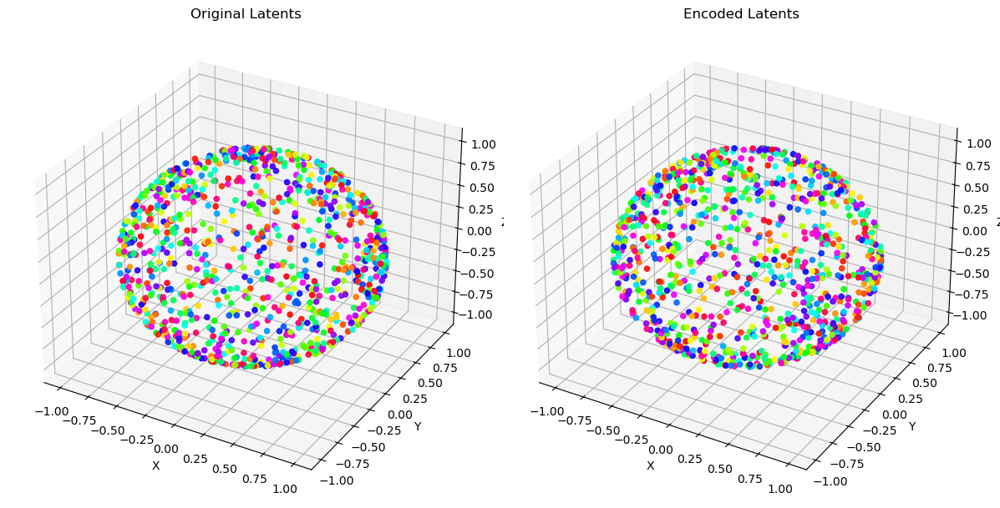

Orthogonal transformation loss:  7.193906784057617
Training loss:  7.178124904632568


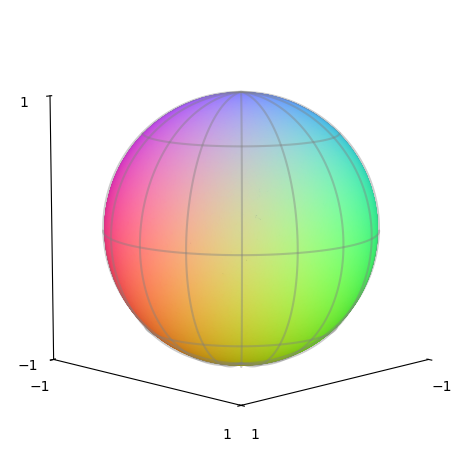

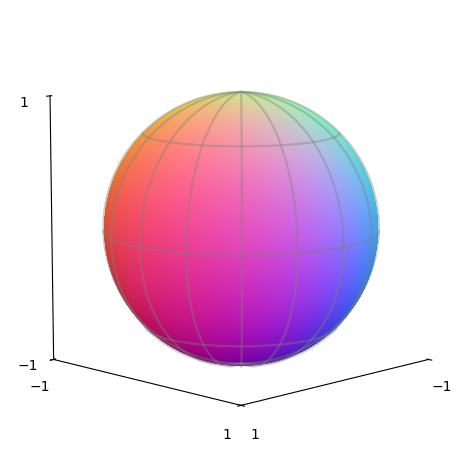

In [5]:
from data.generation import InjectiveLinearDecoder

f, scores = SimCLRExecutor(
    LinearEncoder(4, 3), InjectiveLinearDecoder(3, 4), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

In [6]:
from encoders import SphericalEncoder

f, scores = SimCLRExecutor(
    SphericalEncoder(input_dim=4, output_dim=3), InjectiveLinearDecoder(3, 4), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)


Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.770031929016113 Samples processed: 1 linear disentanglement: 0.3555491268634796 permutation disentanglement: 0.20246650278568268 angle_preservation_error: 0.25463950634002686
Loss: 7.096238613128662 Samples processed: 21 linear disentanglement: 0.4660133421421051 permutation disentanglement: 0.36153101921081543 angle_preservation_error: 0.24103546142578125


Loss: 7.0185370445251465 Samples processed: 41 linear disentanglement: 0.4329676628112793 permutation disentanglement: 0.31931307911872864 angle_preservation_error: 0.25088706612586975
Loss: 6.977303504943848 Samples processed: 61 linear disentanglement: 0.3673631250858307 permutation disentanglement: 0.24594195187091827 angle_preservation_error: 0.2668229341506958
Loss: 6.957921504974365 Samples processed: 81 linear disentanglement: 0.34840425848960876 permutation disentanglement: 0.21956650912761688 angle_preservation_error: 0.268687903881073
Loss: 6.940883636474609 Samples processed: 101 linear disentanglement: 0.3352798521518707 permutation disentanglement: 0.19890855252742767 angle_preservation_error: 0.26745569705963135
Loss: 6.92560338973999 Samples processed: 121 linear disentanglement: 0.32214826345443726 permutation disentanglement: 0.1778232455253601 angle_preservation_error: 0.2678629457950592
Loss: 6.920766353607178 Samples processed: 141 linear disentanglement: 0.31805840

KeyboardInterrupt: 

Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.973092555999756 Samples processed: 1 linear disentanglement: 0.6621156334877014 permutation disentanglement: 0.1001976728439331 angle_preservation_error: 0.26104047894477844
Loss: 7.964780330657959 Samples processed: 21 linear disentanglement: 0.6675651669502258 permutation disentanglement: 0.10602843761444092 angle_preservation_error: 0.2573779225349426
Loss: 7.93428373336792 Samples processed: 41 linear disentanglement: 0.6742027401924133 permutation disentanglement: 0.10252394527196884 angle_preservation_error: 0.2497878074645996
Loss: 7.949604034423828 Samples processed: 61 linear disentanglement: 0.6694515347480774 permutation disentanglement: 0.10723390430212021 angle_preservation_error: 0.24877142906188965
Loss: 7.944126129150391 Samples processed: 81 linear disentanglement: 0.6798932552337646 permutation disentanglement: 0.10953905433416367 angle_preservation_error: 0.2490270435810089
Loss: 7.926958084106445 Sampl

Loss: 7.749716758728027 Samples processed: 441 linear disentanglement: 0.8025786876678467 permutation disentanglement: 0.12447712570428848 angle_preservation_error: 0.20056606829166412
Loss: 7.750038146972656 Samples processed: 461 linear disentanglement: 0.8236465454101562 permutation disentanglement: 0.12740100920200348 angle_preservation_error: 0.200898215174675
Loss: 7.73335599899292 Samples processed: 481 linear disentanglement: 0.817923367023468 permutation disentanglement: 0.12404531240463257 angle_preservation_error: 0.19807952642440796
Loss: 7.7196478843688965 Samples processed: 501 linear disentanglement: 0.8361760973930359 permutation disentanglement: 0.120572030544281 angle_preservation_error: 0.19442060589790344
Loss: 7.707082271575928 Samples processed: 521 linear disentanglement: 0.8502072691917419 permutation disentanglement: 0.12396720796823502 angle_preservation_error: 0.19110740721225739
Loss: 7.712846279144287 Samples processed: 541 linear disentanglement: 0.8471937

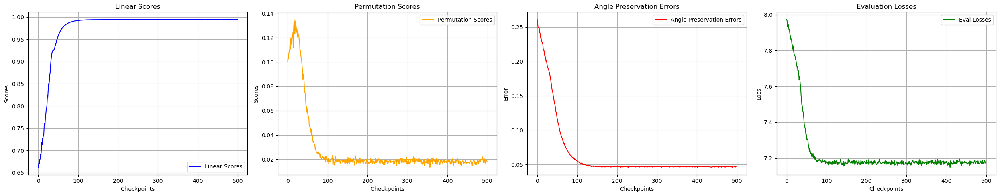

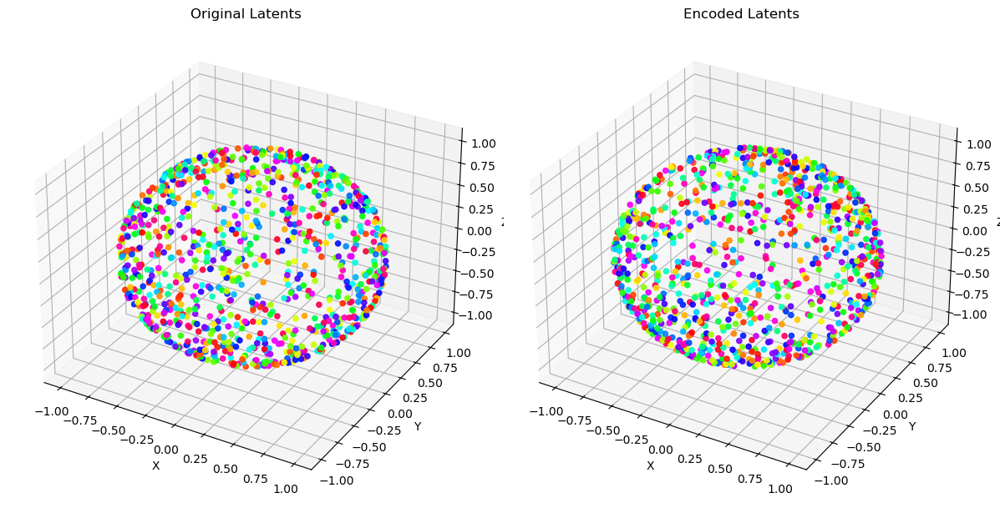

Orhtogonal loss: 7.193963050842285
Training loss 7.184426784515381


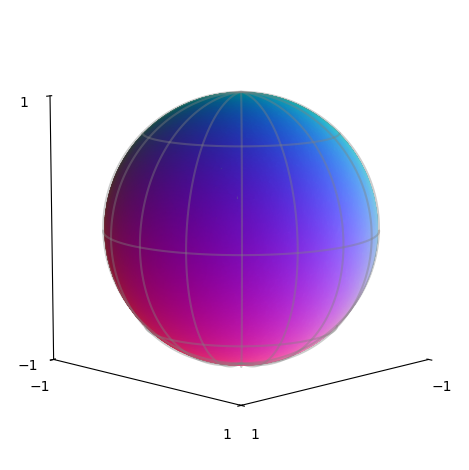

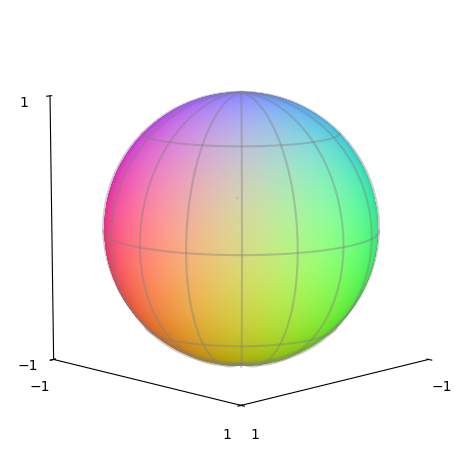

In [33]:
f, scores = SimCLRExecutor(
    LinearEncoder(5, 3), InjectiveLinearDecoder(3, 5), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)


Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.780572891235352 Samples processed: 1 linear disentanglement: 0.8630048632621765 permutation disentanglement: 0.38616445660591125 angle_preservation_error: 0.20663435757160187
Loss: 7.756803035736084 Samples processed: 21 linear disentanglement: 0.869548499584198 permutation disentanglement: 0.3955751955509186 angle_preservation_error: 0.20406675338745117
Loss: 7.750967025756836 Samples processed: 41 linear disentanglement: 0.8705838322639465 permutation disentanglement: 0.3879890441894531 angle_preservation_error: 0.204375222325325
Loss: 7.734185218811035 Samples processed: 61 linear disentanglement: 0.8729127049446106 permutation disentanglement: 0.38697633147239685 angle_preservation_error: 0.20100967586040497
Loss: 7.730838298797607 Samples processed: 81 linear disentanglement: 0.8739182353019714 permutation disentanglement: 0.40093159675598145 angle_preservation_error: 0.19730804860591888
Loss: 7.7101054191589355 Samp

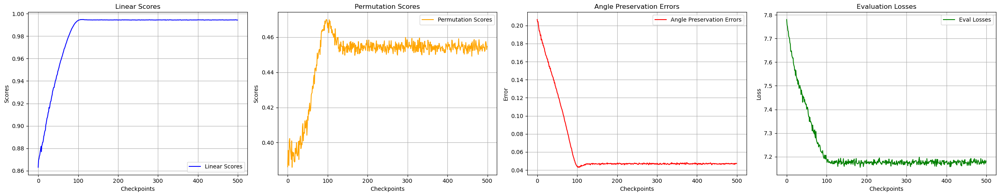

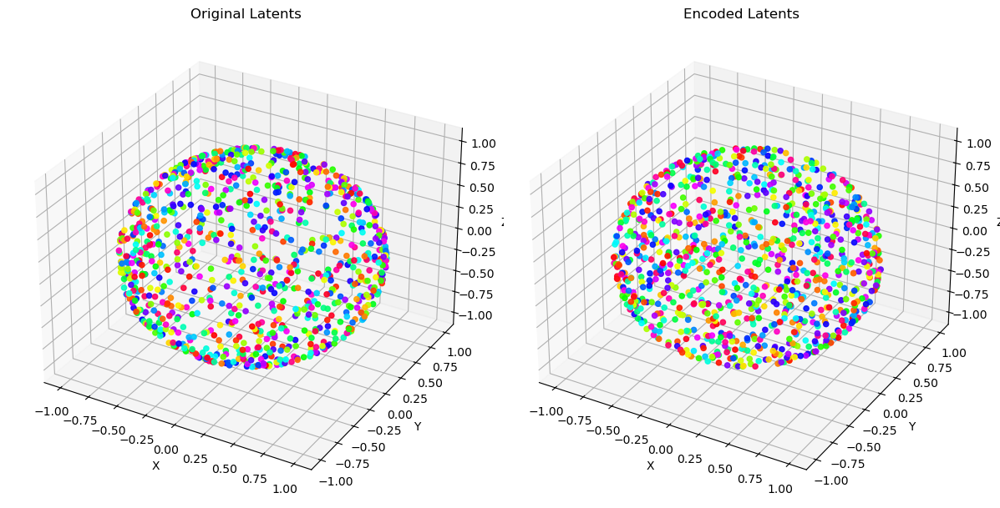

In [27]:
f, scores = SimCLRExecutor(
    SphericalEncoder(5, 3), InjectiveLinearDecoder(3, 5), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.775391578674316 Samples processed: 1 linear disentanglement: 0.8759605884552002 permutation disentanglement: 0.33555737137794495 angle_preservation_error: 0.20421142876148224
Loss: 7.752501487731934 Samples processed: 21 linear disentanglement: 0.8789463639259338 permutation disentanglement: 0.3341192901134491 angle_preservation_error: 0.20038843154907227
Loss: 7.749597072601318 Samples processed: 41 linear disentanglement: 0.8828509449958801 permutation disentanglement: 0.34809064865112305 angle_preservation_error: 0.19428043067455292
Loss: 7.738109111785889 Samples processed: 61 linear disentanglement: 0.8892216682434082 permutation disentanglement: 0.3388789892196655 angle_preservation_error: 0.19558650255203247
Loss: 7.718062400817871 Samples processed: 81 linear disentanglement: 0.8903719782829285 permutation disentanglement: 0.3576008081436157 angle_preservation_error: 0.19124668836593628
Loss: 7.720815181732178 Sam

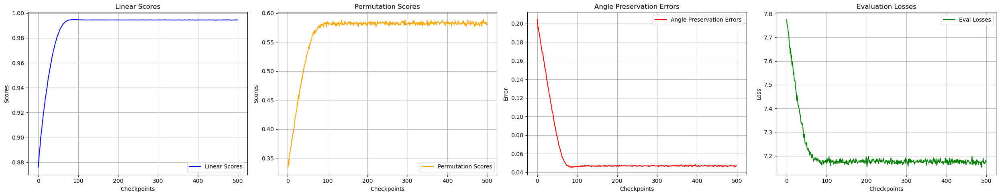

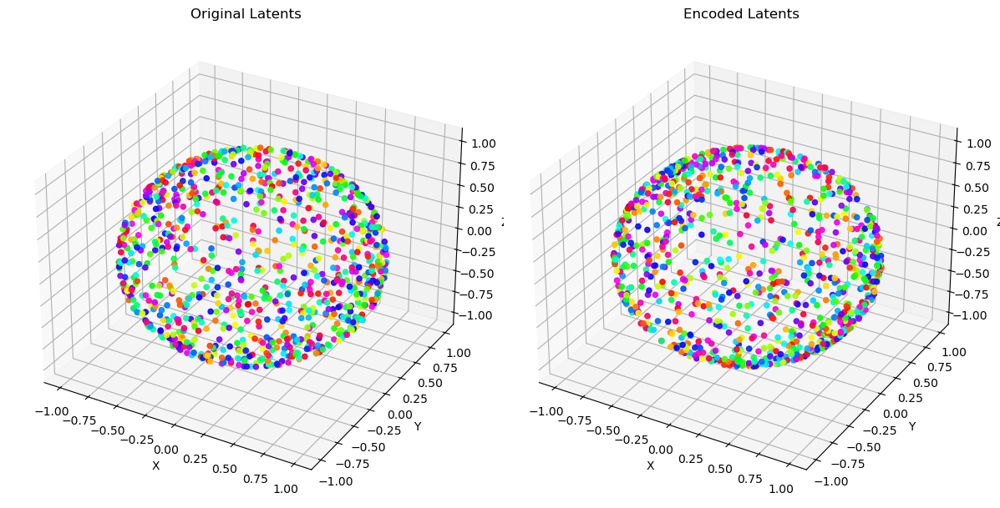

Orhtogonal loss: 7.196061134338379
Training loss 7.178399562835693


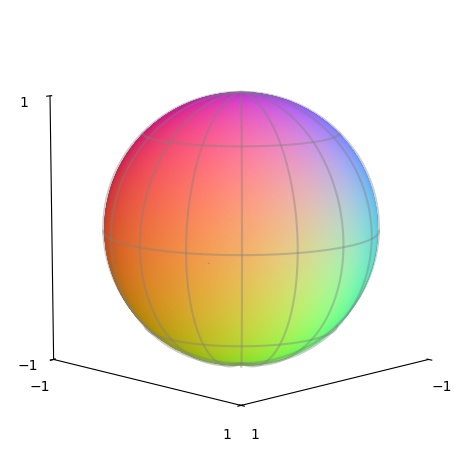

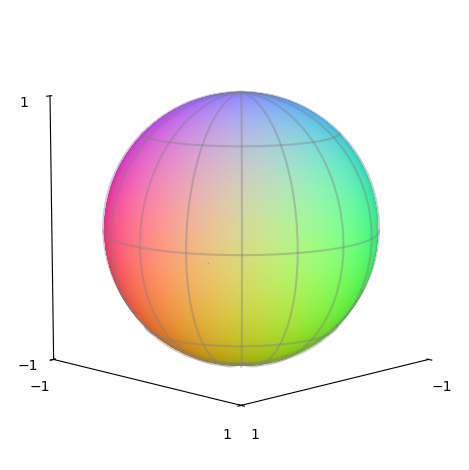

In [38]:
f, scores = SimCLRExecutor(
    LinearEncoder(6, 3), InjectiveLinearDecoder(3, 6), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Spiral generating process

Linear control score: 1.0
Permutation control score: 1.0
Loss: 9.061086654663086 Samples processed: 1 linear disentanglement: 0.1970757395029068 permutation disentanglement: 0.1391010880470276 angle_preservation_error: 0.29317983984947205
Loss: 7.299581050872803 Samples processed: 21 linear disentanglement: 0.9248340129852295 permutation disentanglement: 0.4331185519695282 angle_preservation_error: 0.08941450715065002
Loss: 7.200007915496826 Samples processed: 41 linear disentanglement: 0.9764911532402039 permutation disentanglement: 0.45499610900878906 angle_preservation_error: 0.06419508159160614
Loss: 7.18134069442749 Samples processed: 61 linear disentanglement: 0.985139787197113 permutation disentanglement: 0.4717027246952057 angle_preservation_error: 0.053519364446401596
Loss: 7.177451133728027 Samples processed: 81 linear disentanglement: 0.9850740432739258 permutation disentanglement: 0.4627504348754883 angle_preservation_error: 0.05592166632413864
Loss: 7.190024375915527 Sampl

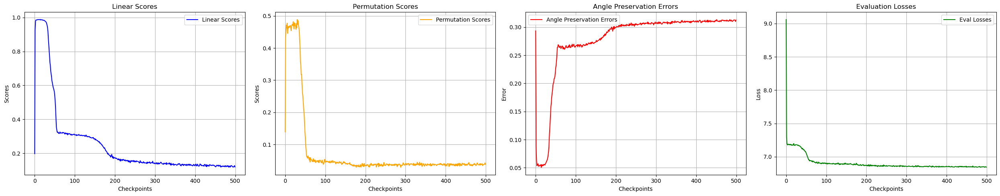

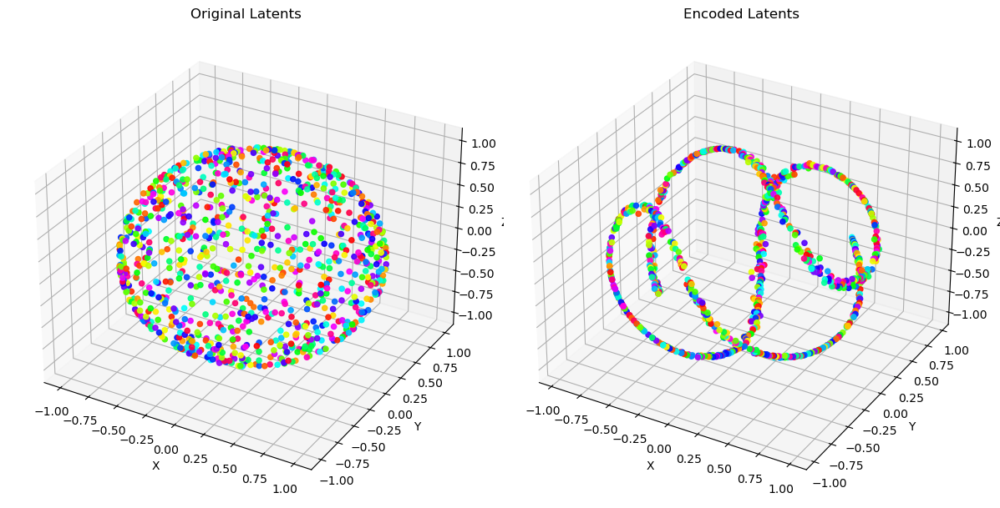

Orthogonal transformation loss:  7.191840171813965
Training loss:  6.8455119132995605


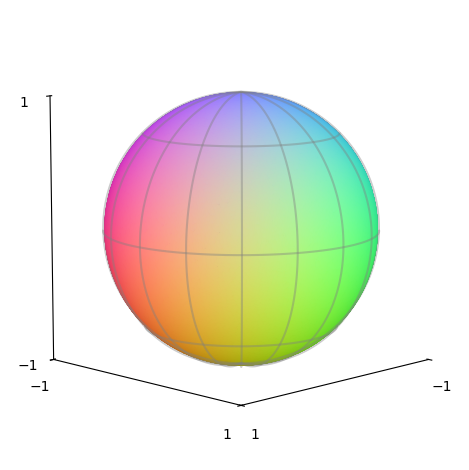

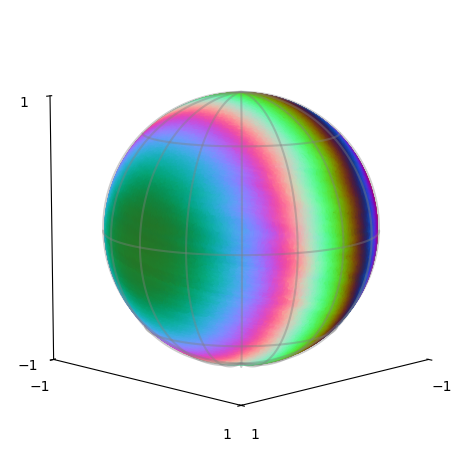

In [7]:
# from visualization_utils.scoring import plot_scores
from visualization_utils.spheres import scatter3d_sphere

from data.generation import SpiralRotation
from encoders import SphericalEncoder

f_spiral = SphericalEncoder(input_dim=3, hidden_dims=[128, 256, 256, 256, 256, 256, 256, 128], output_dim=3)

g_spiral = SpiralRotation(2)

f, scores = SimCLRExecutor(
    f_spiral, g_spiral, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Spiral Generating Process with biased Encoder

Linear control score: 1.0
Permutation control score: 1.0
Loss: 9.610773086547852 Samples processed: 1 linear disentanglement: 0.00971311330795288 permutation disentanglement: 0.005145589355379343 angle_preservation_error: 0.3761967420578003
Loss: 9.508853912353516 Samples processed: 21 linear disentanglement: 0.028161248192191124 permutation disentanglement: 0.010327299125492573 angle_preservation_error: 0.37372153997421265
Loss: 9.468347549438477 Samples processed: 41 linear disentanglement: 0.09574514627456665 permutation disentanglement: 0.034894704818725586 angle_preservation_error: 0.36900660395622253
Loss: 9.368951797485352 Samples processed: 61 linear disentanglement: 0.14794506132602692 permutation disentanglement: 0.046413976699113846 angle_preservation_error: 0.3627076745033264
Loss: 9.270432472229004 Samples processed: 81 linear disentanglement: 0.19122670590877533 permutation disentanglement: 0.06034465506672859 angle_preservation_error: 0.35567381978034973


Loss: 9.198175430297852 Samples processed: 101 linear disentanglement: 0.2310769408941269 permutation disentanglement: 0.08000379800796509 angle_preservation_error: 0.3508604168891907
Loss: 9.08311653137207 Samples processed: 121 linear disentanglement: 0.26713380217552185 permutation disentanglement: 0.10303320735692978 angle_preservation_error: 0.34208378195762634
Loss: 8.989115715026855 Samples processed: 141 linear disentanglement: 0.2829004228115082 permutation disentanglement: 0.14090798795223236 angle_preservation_error: 0.3354680836200714
Loss: 8.931960105895996 Samples processed: 161 linear disentanglement: 0.2906174957752228 permutation disentanglement: 0.17378054559230804 angle_preservation_error: 0.332183301448822
Loss: 8.720438003540039 Samples processed: 181 linear disentanglement: 0.29585954546928406 permutation disentanglement: 0.2062256783246994 angle_preservation_error: 0.32749301195144653
Loss: 8.610279083251953 Samples processed: 201 linear disentanglement: 0.306118

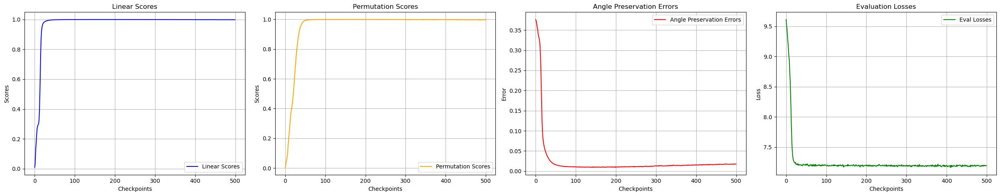

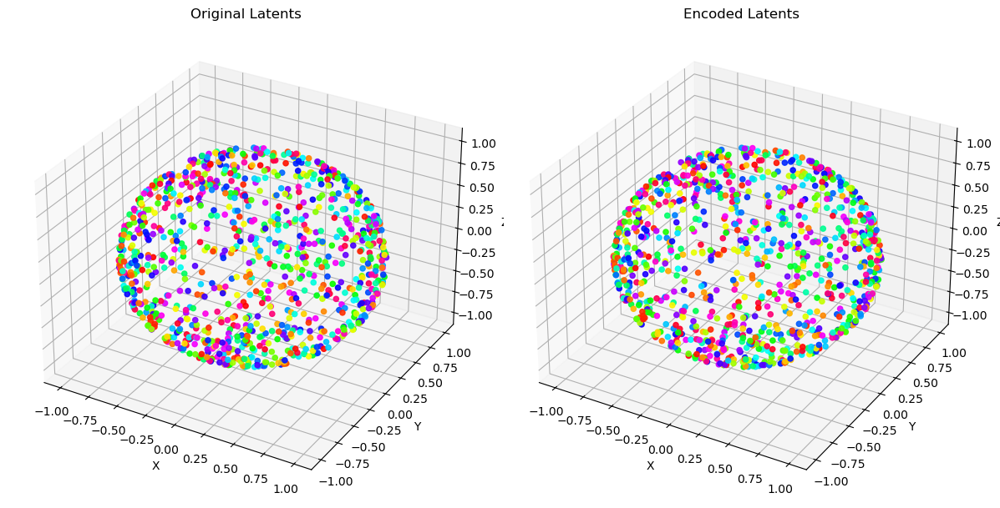

Orthogonal transformation loss:  7.193089962005615
Training loss:  7.1930646896362305


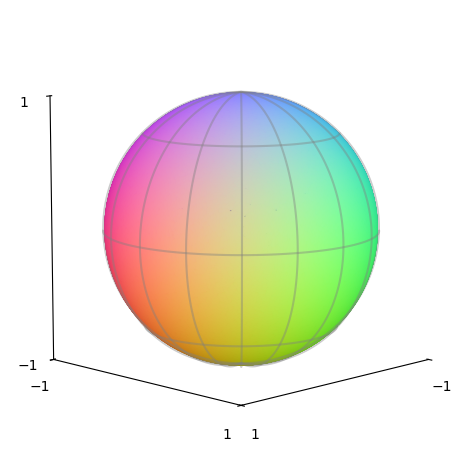

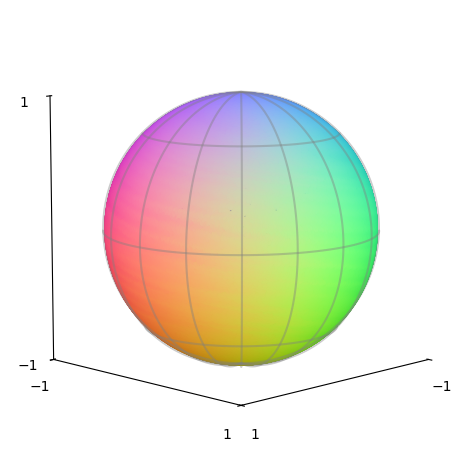

In [12]:
from encoders import InverseSpiralEncoder

f_spiral = InverseSpiralEncoder(3, 3, 2)

f, scores = SimCLRExecutor(
    f_spiral, g_spiral, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Patched generating process

Linear control score: 1.0
Permutation control score: 1.0
Loss: 8.485603332519531 Samples processed: 1 linear disentanglement: 0.3396126925945282 permutation disentanglement: 0.05365157127380371 angle_preservation_error: 0.2638472318649292
Loss: 7.5068559646606445 Samples processed: 21 linear disentanglement: 0.7994194626808167 permutation disentanglement: 0.017510950565338135 angle_preservation_error: 0.141802579164505
Loss: 7.394824504852295 Samples processed: 41 linear disentanglement: 0.8772521018981934 permutation disentanglement: 0.025084415450692177 angle_preservation_error: 0.10918641835451126
Loss: 7.3279547691345215 Samples processed: 61 linear disentanglement: 0.8996708989143372 permutation disentanglement: 0.030892133712768555 angle_preservation_error: 0.0992928072810173
Loss: 7.299918174743652 Samples processed: 81 linear disentanglement: 0.9168868064880371 permutation disentanglement: 0.025218823924660683 angle_preservation_error: 0.09322789311408997
Loss: 7.29249858856201

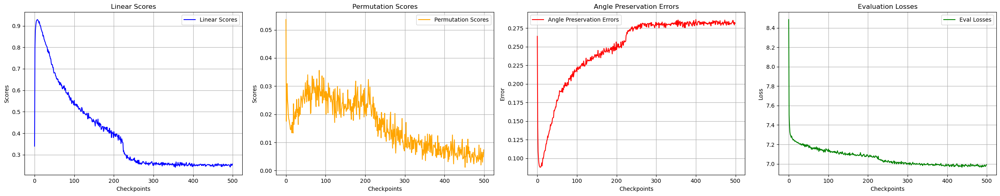

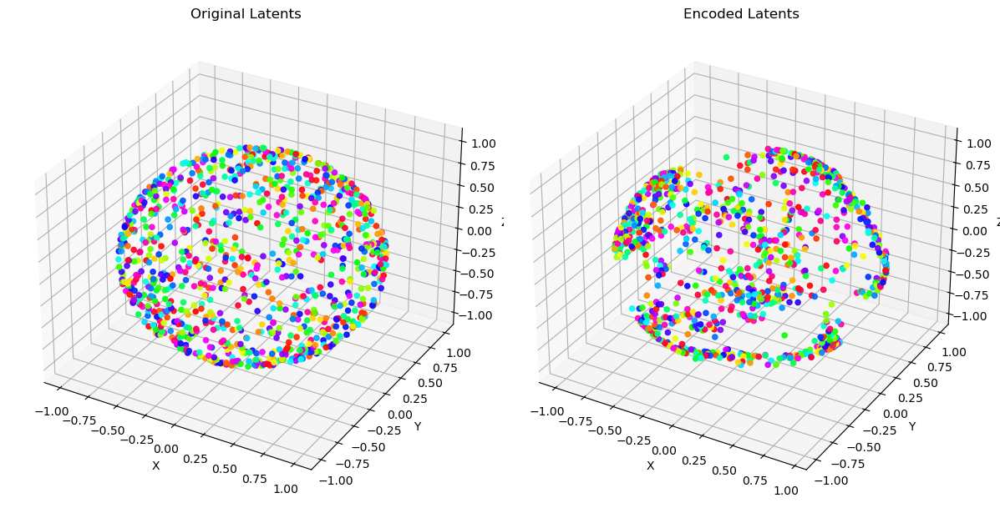

Orthogonal transformation loss:  7.194611072540283
Training loss:  6.991244316101074


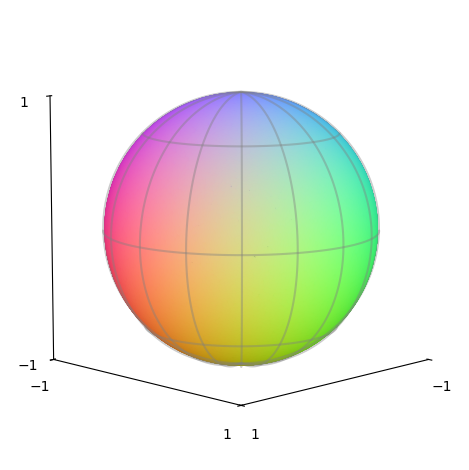

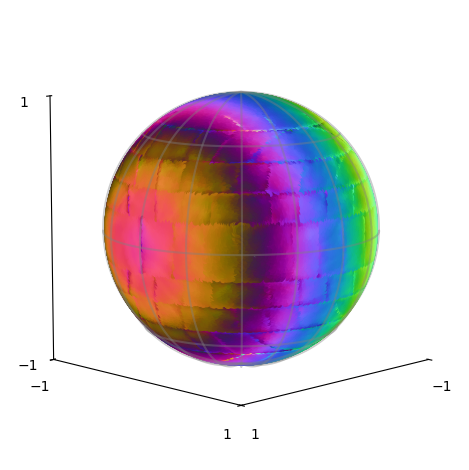

In [ ]:
from data.generation import Patches
from encoders import SphericalEncoder

g_patches = Patches(5, device)
f_patches = SphericalEncoder(input_dim=3, hidden_dims=[128, 256, 128], output_dim=3)

f_patches, scores = SimCLRExecutor(
    f_patches, g_patches, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

Linear control score: 1.0
Permutation control score: 1.0
Loss: 8.167766571044922 Samples processed: 1 linear disentanglement: 0.4117450714111328 permutation disentanglement: 0.3366723358631134 angle_preservation_error: 0.25255531072616577
Loss: 8.126384735107422 Samples processed: 21 linear disentanglement: 0.4121226370334625 permutation disentanglement: 0.3334716558456421 angle_preservation_error: 0.2492256909608841
Loss: 8.105198860168457 Samples processed: 41 linear disentanglement: 0.40748271346092224 permutation disentanglement: 0.32061997056007385 angle_preservation_error: 0.24695780873298645
Loss: 8.102685928344727 Samples processed: 61 linear disentanglement: 0.42002418637275696 permutation disentanglement: 0.32298341393470764 angle_preservation_error: 0.2407594472169876
Loss: 8.09414291381836 Samples processed: 81 linear disentanglement: 0.42313718795776367 permutation disentanglement: 0.32670775055885315 angle_preservation_error: 0.2393181025981903
Loss: 8.074296951293945 Sam

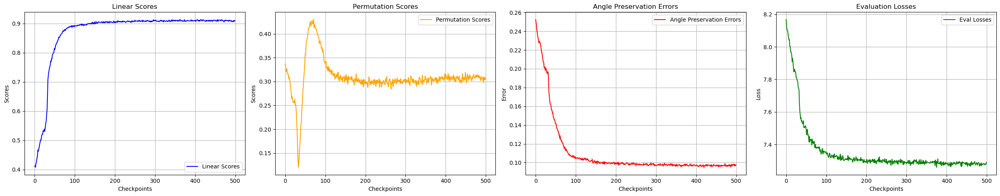

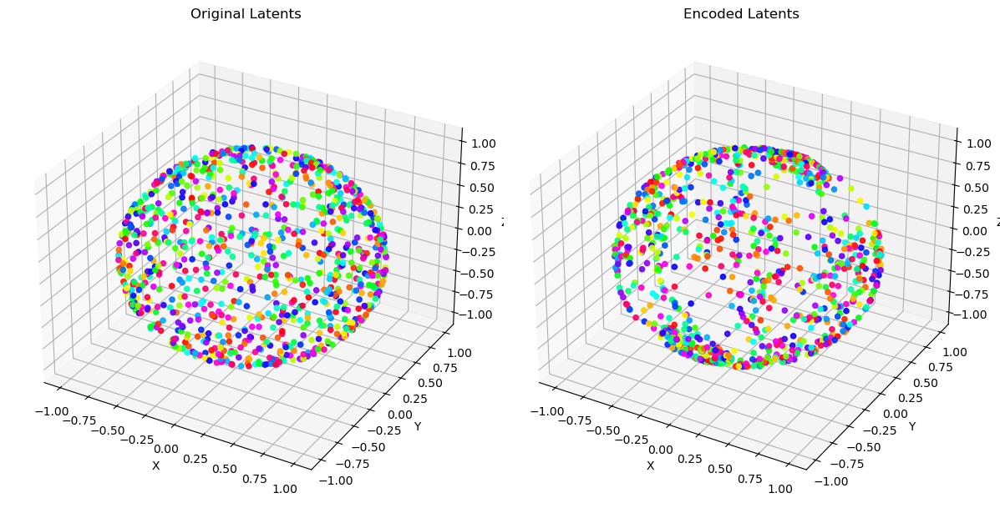

Orthogonal transformation loss:  7.194026470184326
Training loss:  7.290911674499512


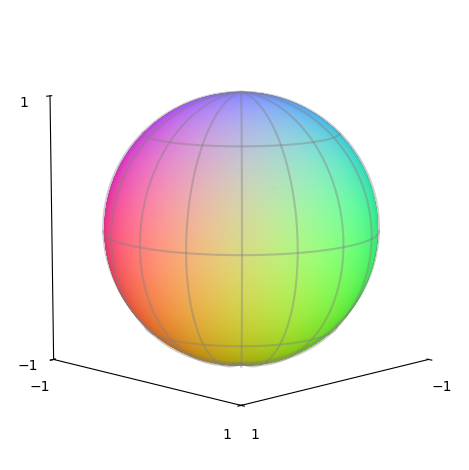

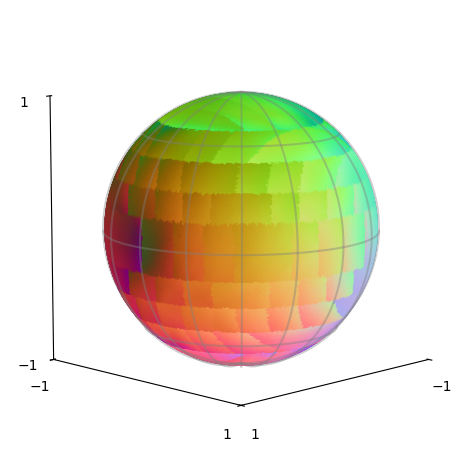

In [27]:
from encoders import InversePatchesEncoder


g_patches = Patches(5, device)
f_patches = InversePatchesEncoder(3, 3, 5).to(device)  # Move to device

f_patches, scores = SimCLRExecutor(
    f_patches, g_patches, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Experiment with the invertible MLP as a data generating process

condition number threshold: 1.054852
layer 1/3,  condition number: 1.0543239841660923
layer 2/3,  condition number: 1.0363689354548615
layer 3/3,  condition number: 1.0495546286721686


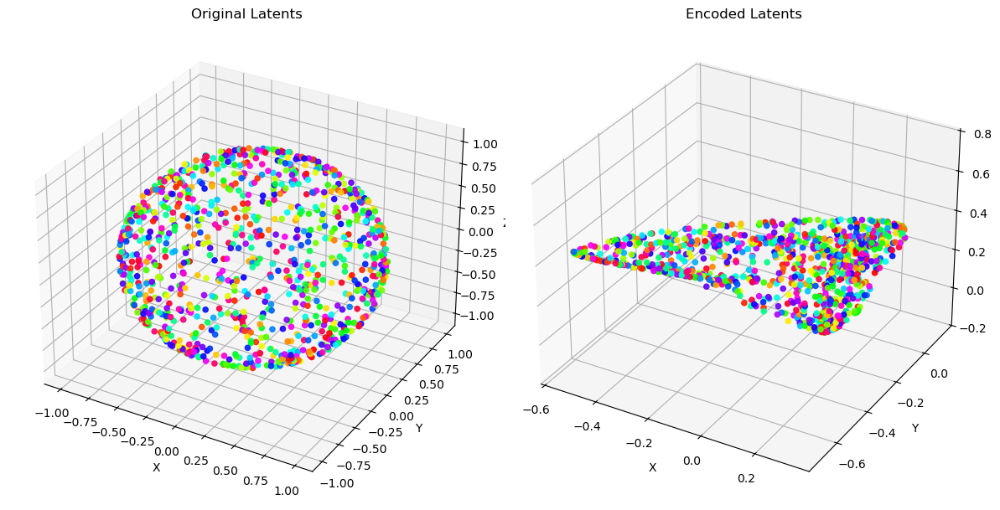

In [28]:
from invertible_network_utils import construct_invertible_mlp

g_mlp = construct_invertible_mlp(
        n=3,
        n_layers=3,
        act_fct='leaky_relu',
        cond_thresh_ratio=0.0,
        n_iter_cond_thresh=25000,
).to(device)

z = full_sphere.uniform(1000).to(device)

visualize_spheres_side_by_side(plt, z.cpu(), g_mlp(z).cpu())

Linear control score: 1.0
Permutation control score: 1.0
Loss: 8.081058502197266 Samples processed: 1 linear disentanglement: 0.3467818796634674 permutation disentanglement: 0.08337721973657608 angle_preservation_error: 0.2691967189311981
Loss: 7.379092216491699 Samples processed: 21 linear disentanglement: 0.5960280299186707 permutation disentanglement: 0.17686419188976288 angle_preservation_error: 0.19356906414031982
Loss: 7.224830627441406 Samples processed: 41 linear disentanglement: 0.61966472864151 permutation disentanglement: 0.13592791557312012 angle_preservation_error: 0.19378159940242767
Loss: 7.159912109375 Samples processed: 61 linear disentanglement: 0.6052842736244202 permutation disentanglement: 0.1540244221687317 angle_preservation_error: 0.20205621421337128
Loss: 7.1456122398376465 Samples processed: 81 linear disentanglement: 0.5932235717773438 permutation disentanglement: 0.15624098479747772 angle_preservation_error: 0.2059776932001114
Loss: 7.133301734924316 Samples

Loss: 7.099910736083984 Samples processed: 121 linear disentanglement: 0.573581874370575 permutation disentanglement: 0.15386031568050385 angle_preservation_error: 0.21037423610687256
Loss: 7.101380825042725 Samples processed: 141 linear disentanglement: 0.5501368045806885 permutation disentanglement: 0.14062194526195526 angle_preservation_error: 0.21565958857536316
Loss: 7.097704887390137 Samples processed: 161 linear disentanglement: 0.5200933814048767 permutation disentanglement: 0.12213262170553207 angle_preservation_error: 0.22245126962661743
Loss: 7.062801361083984 Samples processed: 181 linear disentanglement: 0.494756817817688 permutation disentanglement: 0.12026911973953247 angle_preservation_error: 0.22827567160129547
Loss: 7.0328688621521 Samples processed: 201 linear disentanglement: 0.41938135027885437 permutation disentanglement: 0.09263531118631363 angle_preservation_error: 0.251125305891037
Loss: 7.001441955566406 Samples processed: 221 linear disentanglement: 0.3509951

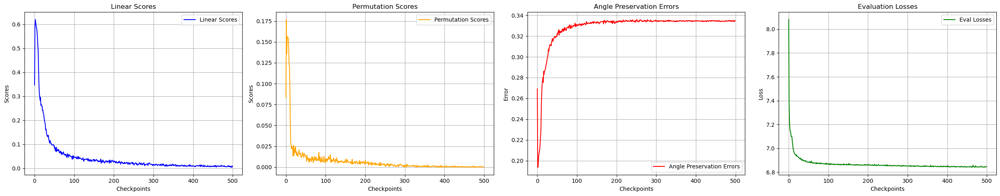

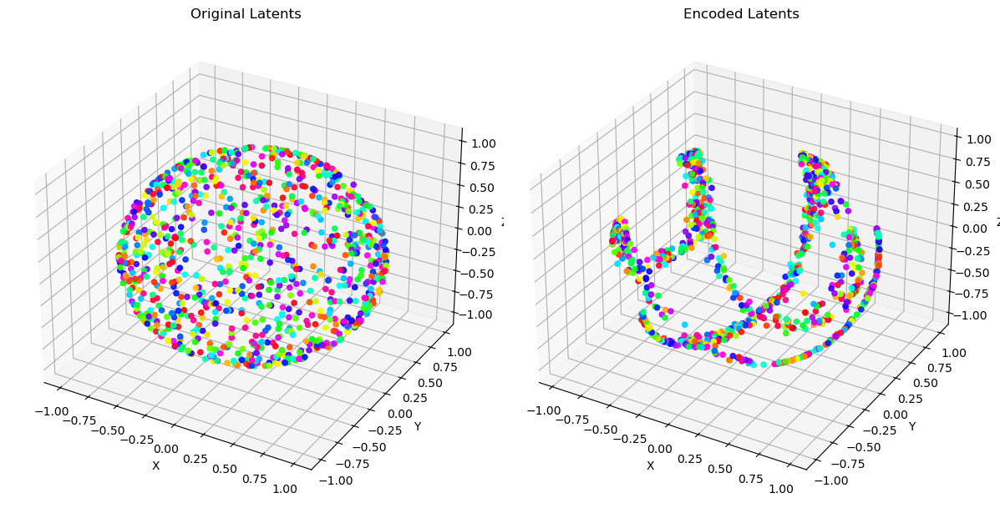

Orthogonal transformation loss:  7.191878318786621
Training loss:  6.845523357391357


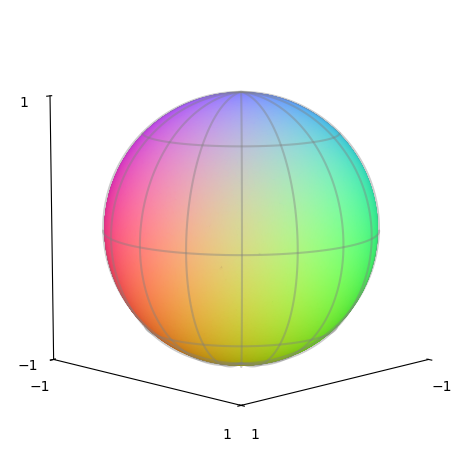

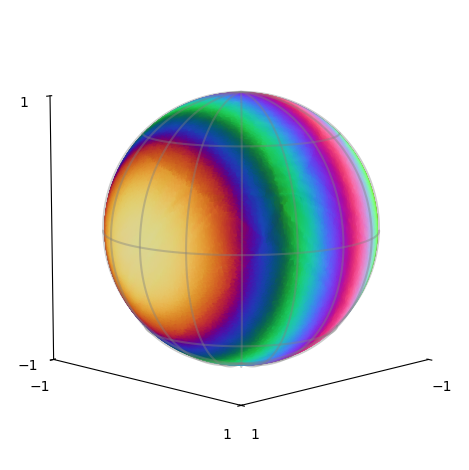

In [30]:
f_mlp = SphericalEncoder(input_dim=3, hidden_dims=[128, 256, 128], output_dim=3).to(device)

f_mlp, scores = SimCLRExecutor(
    f_mlp, g_mlp, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Next

- Run it with a correct model (Cross-Entropy with a correct normalizer)